# Explainable AI - ACM Project

## Decode the "Black Box"

Link to colab : https://colab.research.google.com/drive/1bD5leWtP_tdlT6VbzC7tWHw99_Z0VsJ_?usp=sharing

## Memebrs of the Project



*   Saranath P    - IITM BS
*   Janani D      - IITM BS
*   Visist Tallam - IITM BS
*   Madhuram      - IITM BS
*   Chaitanya     - Kalasalingam University



# About the Project


The project aims to attempt to explain the "Black Box". We have taken Brain tumor dataset and used a varient of CNN model "DenseNet169" and finetuned it for the tumor dataset. And with the help of GradCAM and Sparse Auto encoders, we tried to check if the model is actually trying to look at the right features.

To ensure the model's capacity, we have consulted a doctor who is both equipped with the classification of tumors and have worked in this field.

# About Explainable AI

1. Transparency: Explainable AI helps make neural networks, like DenseNet169, transparent by showing which parts of a brain scan influenced the model's predictions using techniques like Grad-CAM.

2. Trust: By visualizing model attention, Grad-CAM builds trust in AI-assisted diagnosis by confirming that the model focuses on relevant tumor regions rather than irrelevant areas.

3. Model Improvement: Grad-CAM highlights incorrect focus areas, allowing researchers to refine the model to improve accuracy and reliability in detecting brain tumors.

4. Regulatory Compliance: Explainability meets healthcare regulations by providing interpretable and traceable AI decisions, ensuring ethical and legal standards in medical diagnostics.

5. Error Analysis: Explainable AI helps in understanding and correcting model errors, leading to better performance and more accurate predictions for brain tumor detection.

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'brain-tumor-mri-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1608934%2F2645886%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240611%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240611T151652Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3681cff31c6d2683635b12a018b03b531b8be6dac7d2b0ba5f4525461313d705d386072b1e8a9e7ce9d77d48534549bcdcabb207ad0935e92d6bd6eac1b4223ec9ff4626c645d6ed851122d2a4c09c07ce37155c1785106b7502611c736d3ea9431972b24a7aba48a5df58e95f37e9f4c74e3d886113c16b1ea668c6210bdfcb0f76ad9226352bac10c09a0f2199820cbe2cc0312e02584c2045b8e7b340535999015fc1413e6df8e1a072c9a3f33344bb280f3f7a7e224769a6a85833ceed8372b5c2a3a8cec0a3268f522902e8553d55c2c178a8c40d7b0cb8f3c353c06677dd2c45a99c52999d09fd2253240b4b5374f1c7ea4bdd8386e449ce5fae12b42d'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 155791278 bytes downloaded
Downloaded and uncompressed: brain-tumor-mri-dataset
Data source import complete.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Streaming output truncated to the last 5000 lines.
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_1123.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0850.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0501.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0395.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0430.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0322.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_1025.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0570.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0324.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_1313.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0958.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0835.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0650.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/gliom

In [ ]:
import os
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader
from PIL import Image
import os
from sklearn.preprocessing import LabelEncoder

In [ ]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(labels)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        # Encode label
        label = self.label_encoder.transform([label])[0]

        return image, label

In [ ]:
def load_images_from_folders(folder_paths):
    image_paths = []
    labels = []
    for idx, folder in enumerate(folder_paths):
        for root, _, files in os.walk(folder):
            for file in files:

                image_paths.append(os.path.join(root, file))
                label = folder.split("/")[-1]
                labels.append(label)
    return image_paths, labels

In [ ]:
folder_paths = [
                "/kaggle/input/brain-tumor-mri-dataset/Training/glioma",
                "/kaggle/input/brain-tumor-mri-dataset/Training/meningioma",
                "/kaggle/input/brain-tumor-mri-dataset/Training/notumor",
                "/kaggle/input/brain-tumor-mri-dataset/Training/pituitary"
               ]

image_paths, labels = load_images_from_folders(folder_paths)

# DenseNet169

1. DenseNet169 is a variant of the DenseNet architecture. DenseNet is a type of convolutional neural network that utilizes dense connections between layers.
2. The architecture of DenseNet169 includes four dense blocks. Each dense block is a set of layers where each layer is connected to all other layers with matching feature-map sizes.
3. To preserve the feed-forward nature, each layer obtains additional inputs from all preceding layers and passes on its own feature-maps to all subsequent layers.

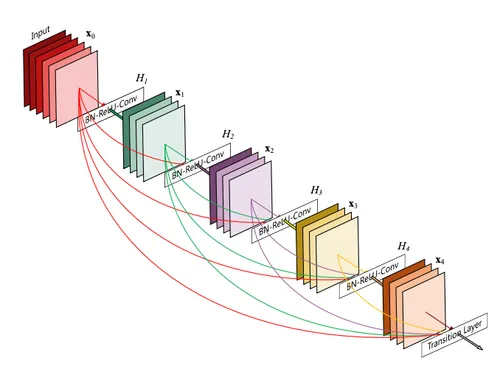

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, random_split, Dataset
from PIL import Image
import os



image_paths, labels = load_images_from_folders(folder_paths)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


base_model = models.densenet169(weights="DenseNet169_Weights.IMAGENET1K_V1")

# Freeze all layers except the last 10 for fine-tuning
for param in list(base_model.parameters())[:-10]:
    param.requires_grad = False


num_ftrs = base_model.classifier.in_features
base_model.classifier = nn.Sequential(
    nn.BatchNorm1d(num_ftrs, momentum=0.99, eps=0.001),
    nn.Linear(num_ftrs, 256),
    nn.ReLU(),
    nn.Dropout(p=0.45),
    nn.Linear(256, len(folder_paths)),
    nn.Softmax(dim=1)
)


class CustomDenseNet(nn.Module):
    def __init__(self, base_model):
        super(CustomDenseNet, self).__init__()
        self.base_model = base_model

    def forward(self, x):
        x = self.base_model(x)
        return x

model = CustomDenseNet(base_model)
model = model.to(device)


loss_func = nn.CrossEntropyLoss()
optimizer = optim.Adamax(model.parameters(), lr=0.001)


transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])



dataset = CustomDataset(image_paths, labels, transform=transform)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True)




Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:00<00:00, 203MB/s]


In [ ]:
# Training loop
num_epochs = 6

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = loss_func(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == labels).sum().item()
        total_predictions += labels.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = correct_predictions / total_predictions
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}')

    # Validation
    model.eval()
    val_running_loss = 0.0
    val_correct_predictions = 0
    val_total_predictions = 0

    with torch.no_grad():
        for val_images, val_labels in val_loader:
            val_images = val_images.to(device)
            val_labels = val_labels.to(device)

            val_outputs = model(val_images)
            val_loss = loss_func(val_outputs, val_labels)

            val_running_loss += val_loss.item() * val_images.size(0)
            _, val_predicted = torch.max(val_outputs, 1)
            val_correct_predictions += (val_predicted == val_labels).sum().item()
            val_total_predictions += val_labels.size(0)

    val_epoch_loss = val_running_loss / len(val_loader.dataset)
    val_epoch_acc = val_correct_predictions / val_total_predictions
    print(f'Validation Loss: {val_epoch_loss:.4f}, Validation Accuracy: {val_epoch_acc:.4f}')

Epoch [1/6], Loss: 0.9232, Accuracy: 0.8492
Validation Loss: 0.8324, Validation Accuracy: 0.9125
Epoch [2/6], Loss: 0.8377, Accuracy: 0.9127
Validation Loss: 0.8154, Validation Accuracy: 0.9318
Epoch [3/6], Loss: 0.8168, Accuracy: 0.9300
Validation Loss: 0.7970, Validation Accuracy: 0.9493
Epoch [4/6], Loss: 0.7990, Accuracy: 0.9486
Validation Loss: 0.7960, Validation Accuracy: 0.9449
Epoch [5/6], Loss: 0.7910, Accuracy: 0.9549
Validation Loss: 0.7890, Validation Accuracy: 0.9589
Epoch [6/6], Loss: 0.7823, Accuracy: 0.9652
Validation Loss: 0.7892, Validation Accuracy: 0.9545


In [ ]:
import torch
from sklearn.metrics import classification_report



model.eval()
folder_paths_test = [
    "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary"
]

image_paths_test, labels_test = load_images_from_folders(folder_paths_test)

test_dataset = CustomDataset(image_paths_test, labels_test, transform=transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=True)

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

# Print accuracy
correct = sum(p == t for p, t in zip(all_predictions, all_labels))
total = len(all_labels)
print(f'Accuracy of the model on the Test images: {100 * correct / total}%')

# Generate classification report
report = classification_report(all_labels, all_predictions, target_names=['glioma', 'meningioma', 'notumor', 'pituitary'])
print("Classification Report:\n", report)


Accuracy of the model on the Test images: 93.44012204424104%
Classification Report:
               precision    recall  f1-score   support

      glioma       0.97      0.85      0.91       300
  meningioma       0.85      0.90      0.87       306
     notumor       0.97      0.98      0.97       405
   pituitary       0.95      0.99      0.97       300

    accuracy                           0.93      1311
   macro avg       0.93      0.93      0.93      1311
weighted avg       0.94      0.93      0.93      1311



## Evaluate Model

In [ ]:
correct_samples = []
wrong_samples = []
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        correct_preds = (predicted == labels).nonzero(as_tuple=True)[0].cpu().numpy()
        wrong_preds = (predicted != labels).nonzero(as_tuple=True)[0].cpu().numpy()

        correct_samples.extend([(images[i].cpu(), predicted[i].cpu(), labels[i].cpu()) for i in correct_preds])
        wrong_samples.extend([(images[i].cpu(), predicted[i].cpu(), labels[i].cpu()) for i in wrong_preds])

print(f'Accuracy of the model on the train images: {100 * correct / total}%')

Accuracy of the model on the train images: 98.13963668198731%


In [ ]:
len(wrong_samples), len(correct_samples)

(85, 4484)

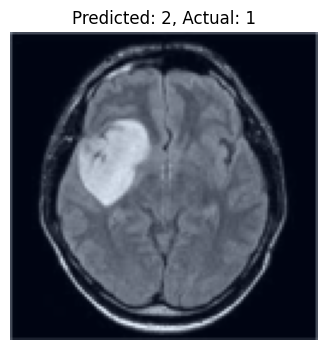

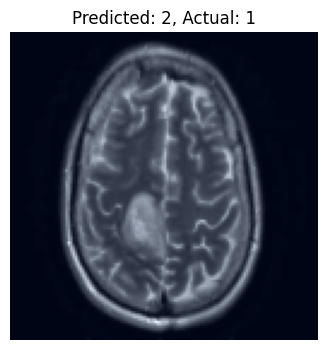

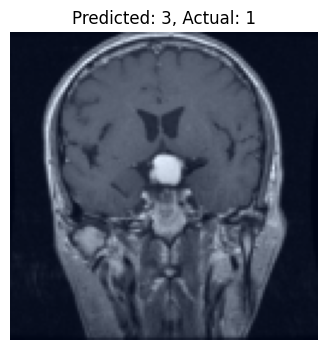

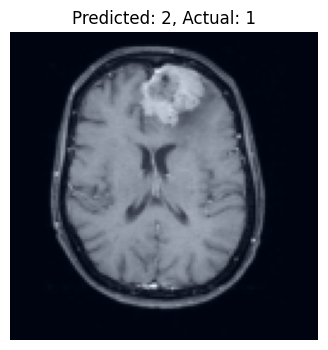

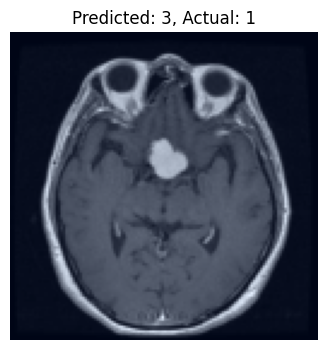

In [ ]:
def display_wrong_samples(category_idx, wrong_samples):
    category_samples = [sample for sample in wrong_samples if sample[2].item() == category_idx]

    for idx, (image, pred, label) in enumerate(category_samples):
        plt.figure(figsize=(4, 4))
        img = np.transpose(image.numpy(), (1, 2, 0))
        img = (img - img.min()) / (img.max() - img.min())
        plt.imshow(img)
        plt.title(f'Predicted: {pred.item()}, Actual: {label.item()}')
        plt.axis('off')
        plt.show()
        if idx >= 4:  # Display up to 5 samples
            break

#
specific_category_idx = 1
display_wrong_samples(specific_category_idx, wrong_samples)

Accuracy of the model on the train images: 98.13963668198731%


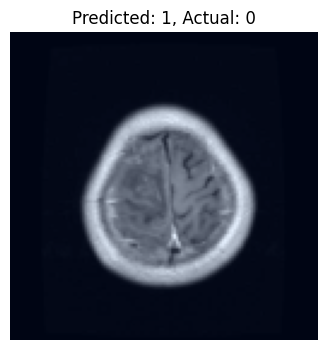

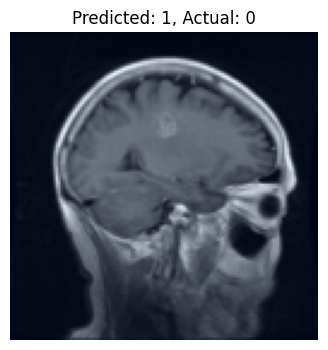

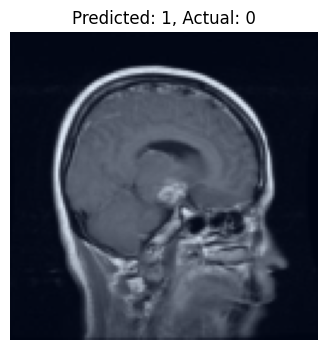

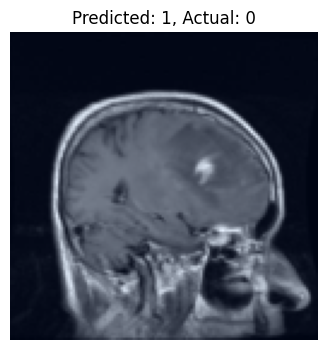

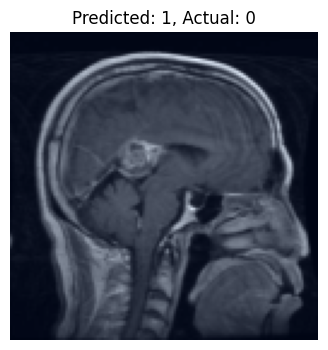

In [ ]:
model.eval()

wrong_samples = []
with torch.no_grad():
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)

        wrong_preds = (predicted != labels).nonzero(as_tuple=True)[0].cpu().numpy()
        wrong_samples.extend([(images[i].cpu(), predicted[i].cpu(), labels[i].cpu()) for i in wrong_preds])

print(f'Accuracy of the model on the train images: {100 * correct / total}%')

def display_wrong_samples(category_idx, wrong_samples):
    category_samples = [sample for sample in wrong_samples if sample[2].item() == category_idx]

    for idx, (image, pred, label) in enumerate(category_samples):
        plt.figure(figsize=(4, 4))
        img = np.transpose(image.numpy(), (1, 2, 0))
        img = (img - img.min()) / (img.max() - img.min())
        plt.imshow(img)
        plt.title(f'Predicted: {pred.item()}, Actual: {label.item()}')
        plt.axis('off')
        plt.show()
        if idx >= 4:
            break


specific_category_idx = 0  # We can change this index for different categories
display_wrong_samples(specific_category_idx, wrong_samples)

# Using GradCAM to visualize the activations of the neurons

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_image, target_class):
        self.model.eval()
        input_image = input_image.unsqueeze(0).to(device)
        output = self.model(input_image)
        self.model.zero_grad()
        target = output[0][target_class]
        target.backward()

        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_image.size(2), input_image.size(3)))
        cam -= np.min(cam)
        cam /= np.max(cam)
        return cam


def display_gradcam_for_sample(model, input_image, target_class):
    gradcam = GradCAM(model, model.base_model.features[-1])
    cam = gradcam.generate_cam(input_image, target_class)
    image_np = np.transpose(input_image.cpu().numpy(), (1, 2, 0))
    image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(image_np)
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title('Grad-CAM')
    plt.axis('off')
    plt.show()


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1373: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


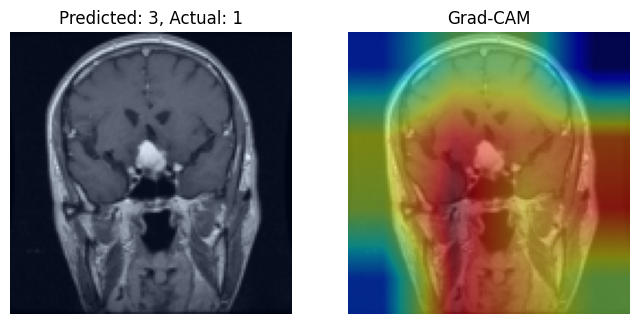

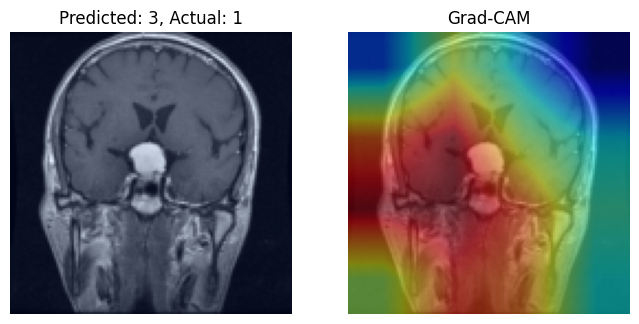

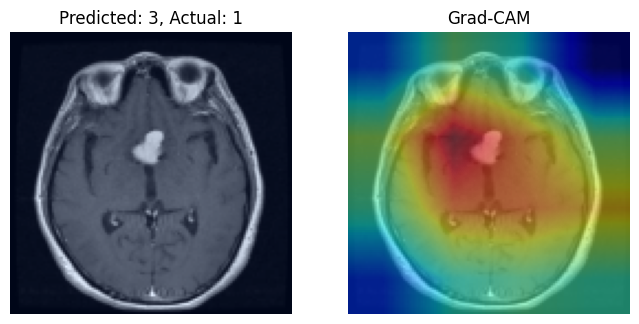

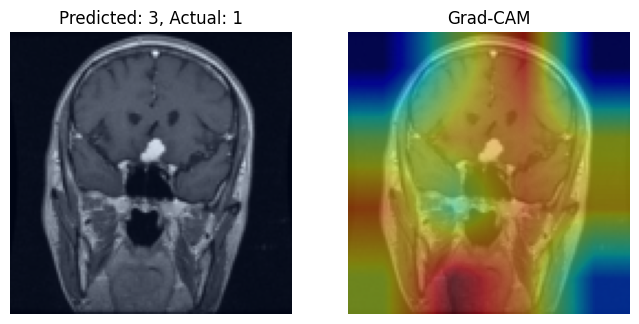

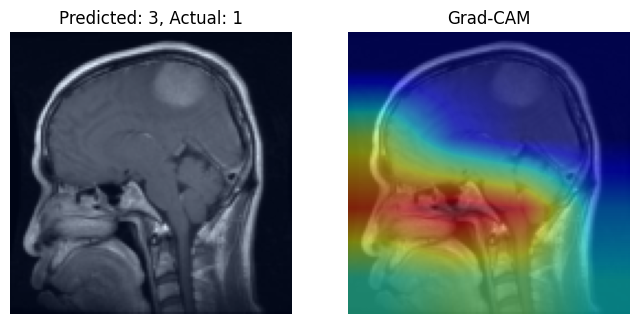

...

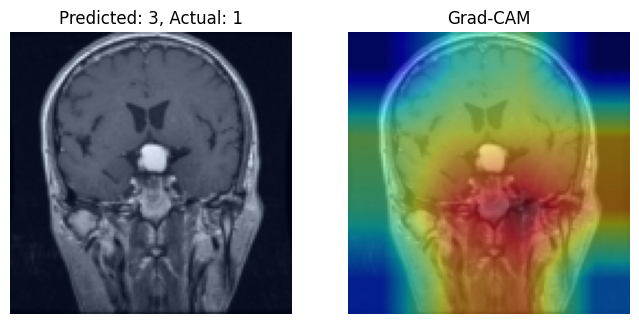

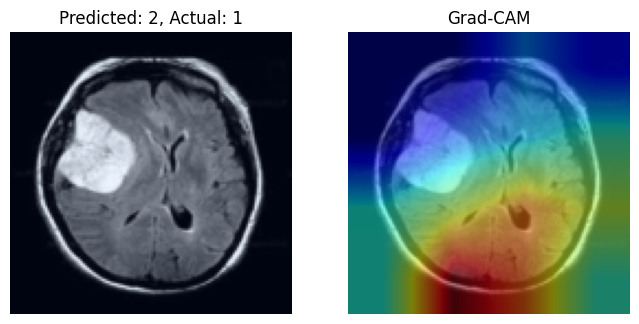

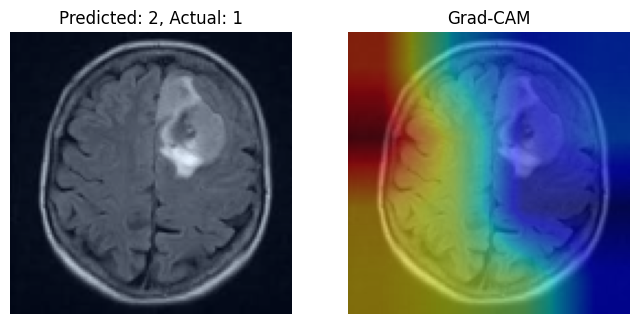

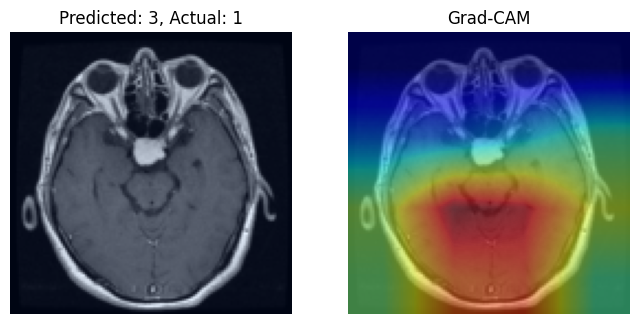

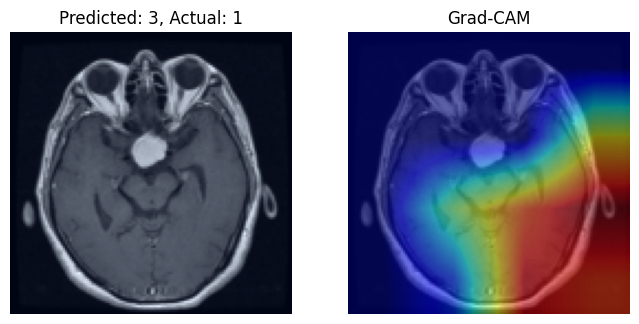

In [ ]:
def visualize_neurons_responsible_for_class(wrong_samples, specific_category_idx):
    gradcam = GradCAM(model, model.base_model.features[-1])

    for idx, (image, pred, label) in enumerate(wrong_samples):
        if label.item() == specific_category_idx:
            cam = gradcam.generate_cam(image, pred.item())
            image_np = np.transpose(image.numpy(), (1, 2, 0))
            image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

            plt.figure(figsize=(8, 8))
            plt.subplot(1, 2, 1)
            plt.imshow(image_np)
            plt.title(f'Predicted: {pred.item()}, Actual: {label.item()}')
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(image_np)
            plt.imshow(cam, cmap='jet', alpha=0.5)
            plt.title('Grad-CAM')
            plt.axis('off')
            plt.show()

            # if idx >= 4:
            #     break


specific_category_idx = 1
visualize_neurons_responsible_for_class(wrong_samples, specific_category_idx)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models




def visualize_neurons_responsible_for_class(samples, specific_category_idx, base_dir,  label_names):
    gradcam = GradCAM(model, model.base_model.features[-1])

    for idx, (image, pred, label) in enumerate(samples):
        if label.item() == specific_category_idx:
            cam = gradcam.generate_cam(image, pred.item())
            status = "correctly_classified" if pred.item() == label.item() else "incorrectly_classified"
            save_path = os.path.join(base_dir, status, label_names[i])
            os.makedirs(save_path, exist_ok=True)
            filename = os.path.join(save_path, f"{idx}_{label_names[specific_category_idx ]}.png")
            image_np = np.transpose(image.numpy(), (1, 2, 0))
            image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())

            plt.figure(figsize=(8, 8))
            plt.subplot(1, 2, 1)
            plt.imshow(image_np)
            plt.title(f'Predicted: {label_names[pred.item()]}, Actual: {label_names[label.item()]}')
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(image_np)
            plt.imshow(cam, cmap='jet', alpha=0.5)
            plt.title('Grad-CAM')
            plt.axis('off')
            plt.savefig(filename)
            # plt.show()
            plt.close()

base_dir = "/content/incorrect_outputs"  # Replace with your desired base directory
label_names = ["glioma", "meningioma", "notumor", "pituitary"]  # Replace with your actual label names
for i in range(4):
  specific_category_idx = i
  visualize_neurons_responsible_for_class(wrong_samples, specific_category_idx, base_dir, label_names)


In [ ]:
# base_dir = "/content/correct_outputs"  # Replace with your desired base directory
# label_names = ["glioma", "meningioma", "notumor", "pituitary"]  # Replace with your actual label names
# # for i in range(4):
# #   specific_category_idx = i
# #   visualize_neurons_responsible_for_class(correct_samples, specific_category_idx, base_dir, label_names)
# specific_category_idx = 0
# visualize_neurons_responsible_for_class(correct_samples, specific_category_idx, base_dir, label_names)



Link to Incorrectly Classified images : https://drive.google.com/drive/folders/1JufGvBpzKHz4dTFZv_7f4Jv-DFkiIgzY?usp=sharing

Link to Drive Glioma (Correctly Classified) : https://drive.google.com/drive/folders/1IGqRC3D0KNmpyID4d7TjTR051n_vDzzJ?usp=sharing

# Download Files

In [ ]:
import shutil
from google.colab import files
shutil.make_archive('/content/incorrect_outputs', 'zip', base_dir)
# shutil.make_archive('/content/correct_outputs', 'zip', base_dir)

files.download('/content/incorrect_outputs.zip')
# files.download('/content/correct_outputs.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Saliency Map

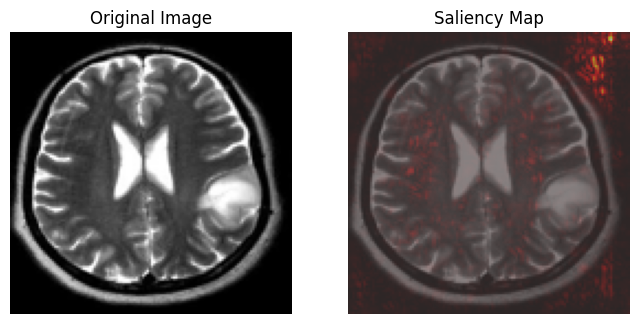

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
import os

# Define a function to preprocess the image
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)
    return image

# Function to compute saliency map
def compute_saliency_map(model, input_image, target_class):
    model.eval()
    input_image = input_image.to(device)
    input_image.requires_grad_()

    output = model(input_image)
    loss = output[0, target_class]
    model.zero_grad()
    loss.backward()

    saliency = input_image.grad.data.abs().squeeze().cpu().numpy()
    saliency = np.max(saliency, axis=0)

    return saliency

# Function to display the saliency map
def display_saliency_map(image_path, saliency_map, save_dir):
    image = Image.open(image_path).convert("RGB")
    image = np.array(image.resize((128, 128)))# Load a sample image
    fig, ax = plt.subplots(1, 2, figsize=(8, 8))
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(image, alpha=0.7)
    plt.imshow(saliency_map, cmap='hot', alpha=0.5)
    plt.title('Saliency Map')
    plt.axis('off')
    saliency_image_path = os.path.join(save_dir, os.path.basename(image_path))
    plt.savefig(saliency_image_path)
    plt.close(fig)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")




sample_image_path = "/kaggle/input/brain-tumor-mri-dataset/Training/notumor/Tr-no_1245.jpg"
input_image = preprocess_image(sample_image_path)


target_class = 3


saliency_map = compute_saliency_map(model, input_image, target_class)


display_saliency_map(sample_image_path, saliency_map, "/content")


# Sparse Auto Encoders

In [ ]:
class SparseAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, sparsity_param=0.05, beta=3):
        super(SparseAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
        )
        self.sparsity_param = sparsity_param
        self.beta = beta

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded, encoded

    def sparsity_loss(self, encoded):
        p_hat = torch.mean(encoded, dim=0)
        sparsity_loss = self.sparsity_param * torch.log(self.sparsity_param / p_hat) + \
                        (1 - self.sparsity_param) * torch.log((1 - self.sparsity_param) / (1 - p_hat))
        return torch.sum(sparsity_loss) * self.beta


In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handlers = []
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.hook_handlers.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handlers.append(self.target_layer.register_backward_hook(backward_hook))

    def generate_cam(self, input_image, target_class=None):
        self.model.zero_grad()
        output = self.model(input_image)
        if target_class is None:
            target_class = torch.argmax(output)
        target = output[0, target_class]
        target.backward()

        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))

        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_image.size(2), input_image.size(3)))
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam

    def clear_hooks(self):
        for handle in self.hook_handlers:
            handle.remove()


In [ ]:

image_paths, labels = load_images_from_folders(folder_paths)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


base_model = models.densenet169(weights="DenseNet169_Weights.IMAGENET1K_V1")


for param in list(base_model.parameters())[:-10]:
    param.requires_grad = False


num_ftrs = base_model.classifier.in_features
base_model.classifier = nn.Sequential(
    nn.BatchNorm1d(num_ftrs, momentum=0.99, eps=0.001),
    nn.Linear(num_ftrs, 256),
    nn.ReLU(),
    nn.Dropout(p=0.45),
    nn.Linear(256, len(folder_paths)),
    nn.Softmax(dim=1)
)

class CustomDenseNet1(nn.Module):
    def __init__(self, base_model):
        super(CustomDenseNet1, self).__init__()
        self.base_model = base_model

    def forward(self, x):
        x = self.base_model(x)
        return x

model = CustomDenseNet1(base_model)
model = model.to(device)

# Sparse Autoencoder
input_dim = 128 * 128 * 3
hidden_dim = 256
autoencoder = SparseAutoencoder(input_dim, hidden_dim).to(device)

# Loss and optimizer
loss_func = nn.CrossEntropyLoss()
sparse_loss_func = nn.MSELoss()
optimizer = optim.Adamax(model.parameters(), lr=0.001)
ae_optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Data transformation
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Custom dataset class
from PIL import ImageOps

def convert_grayscale_to_rgb(image):
    if image.mode == 'L':
        image = image.convert('RGB')
    return image

class CustomDataset1(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(labels)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        # Encode label
        label = self.label_encoder.transform([label])[0]

        return image, label

dataset = CustomDataset1(image_paths, labels, transform=transform)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True)

# Training loop
num_epochs = 6

for epoch in range(num_epochs):
    model.train()
    autoencoder.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        # Train autoencoder
        flat_images = images.view(images.size(0), -1)
        reconstructed, encoded = autoencoder(flat_images)
        ae_loss = sparse_loss_func(reconstructed, flat_images) + autoencoder.sparsity_loss(encoded)
        ae_optimizer.zero_grad()
        ae_loss.backward()
        ae_optimizer.step()

        # Train classifier
        optimizer.zero_grad()
        outputs = model(images)
        loss = loss_func(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == labels).sum().item()
        total_predictions += labels.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = correct_predictions / total_predictions
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}')

    # Validation
    model.eval()
    val_running_loss = 0.0
    val_correct_predictions = 0
    val_total_predictions = 0

    with torch.no_grad():
        for val_images, val_labels in val_loader:
            val_images = val_images.to(device)
            val_labels = val_labels.to(device)

            val_outputs = model(val_images)
            val_loss = loss_func(val_outputs, val_labels)

            val_running_loss += val_loss.item() * val_images.size(0)
            _, val_predicted = torch.max(val_outputs, 1)
            val_correct_predictions += (val_predicted == val_labels).sum().item()
            val_total_predictions += val_labels.size(0)

    val_epoch_loss = val_running_loss / len(val_loader.dataset)
    val_epoch_acc = val_correct_predictions / val_total_predictions
    print(f'Validation Loss: {val_epoch_loss:.4f}, Validation Accuracy: {val_epoch_acc:.4f}')


Epoch [1/6], Loss: 0.9319, Accuracy: 0.8365
Validation Loss: 0.8282, Validation Accuracy: 0.9213
Epoch [2/6], Loss: 0.8410, Accuracy: 0.9087
Validation Loss: 0.8093, Validation Accuracy: 0.9370
Epoch [3/6], Loss: 0.8153, Accuracy: 0.9335
Validation Loss: 0.7971, Validation Accuracy: 0.9501
Epoch [4/6], Loss: 0.7994, Accuracy: 0.9483
Validation Loss: 0.7899, Validation Accuracy: 0.9554
Epoch [5/6], Loss: 0.7857, Accuracy: 0.9621
Validation Loss: 0.7895, Validation Accuracy: 0.9545
Epoch [6/6], Loss: 0.7821, Accuracy: 0.9652
Validation Loss: 0.7898, Validation Accuracy: 0.9545


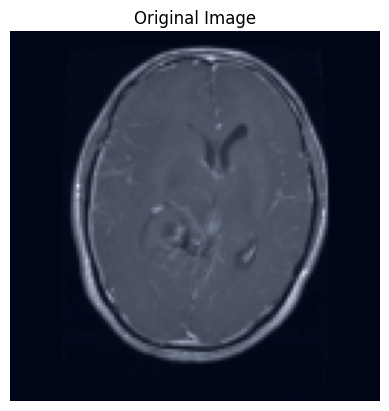

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Assuming gradcam_target_layer is the layer you want to target
gradcam_target_layer = base_model.features[-1]

# Initialize Grad-CAM
gradcam = GradCAM(model, gradcam_target_layer)

# Visualize Grad-CAM on a sample image
sample_image, _ = dataset[1]
sample_image = (sample_image - sample_image.min()) / (sample_image.max() - sample_image.min())
sample_image = sample_image.unsqueeze(0).to(device)

plt.imshow(sample_image.cpu().squeeze().permute(1, 2, 0))
plt.title('Original Image')
plt.axis('off')
plt.show()

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1373: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


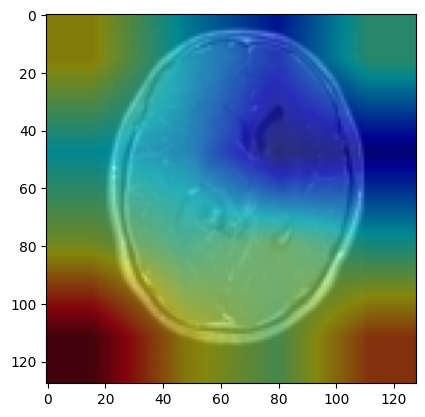

In [ ]:
cam = gradcam.generate_cam(sample_image)
gradcam.clear_hooks()

# Convert CAM to heatmap and overlay on image
heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
heatmap = np.float32(heatmap) / 255
overlay = heatmap + np.float32(sample_image.cpu().numpy()[0].transpose(1, 2, 0))
overlay = np.clip(overlay / np.max(overlay), 0, 1)  # Ensure the overlay data is within [0, 1]

plt.imshow(overlay)
plt.show()


# Some results shared by the doctor

Reasonabily ok Localization - 82, 78, 2, 6, 7, 1, 5

All others are very poor

Surprised how it is getting 93% accuracy looking at very different areas

# What could we have done if we had little more time?

We could have possibily found some patterns of these and try to use GradCAM outcomes for training and look at if the model actually uses the right features to predict the outcomes.